# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [2]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [3]:
# Rui: When doing interactive computing it is common to need to access the underlying shell. This is doable through the use of the exclamation mark ! (or bang).

!mkdir data
!mkdir checkpoints

mkdir: cannot create directory ‘data’: File exists
mkdir: cannot create directory ‘checkpoints’: File exists


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [4]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [5]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

In [6]:
testset

{'X': array([[[[ 38, 129, 150, ..., 115,  96, 101],
          [103, 142, 160, ..., 132,  65,  75],
          [ 60, 153, 169, ..., 142,  47,  60]],
 
         [[ 39, 127, 150, ..., 116,  97, 100],
          [104, 143, 163, ..., 133,  65,  73],
          [ 61, 152, 170, ..., 143,  49,  60]],
 
         [[ 39, 125, 152, ..., 117,  97,  99],
          [104, 143, 168, ..., 134,  65,  71],
          [ 62, 151, 172, ..., 144,  50,  59]],
 
         ..., 
         [[ 41, 121, 153, ..., 114,  86,  95],
          [102, 133, 172, ..., 136,  61,  63],
          [ 61, 153, 180, ..., 141,  54,  52]],
 
         [[ 42, 123, 150, ..., 114,  87,  95],
          [103, 134, 171, ..., 136,  62,  63],
          [ 62, 156, 181, ..., 142,  55,  52]],
 
         [[ 39, 123, 147, ..., 115,  88,  96],
          [ 97, 135, 169, ..., 136,  63,  64],
          [ 57, 157, 180, ..., 143,  56,  51]]],
 
 
        [[[ 39, 134, 150, ..., 122,  96, 109],
          [104, 150, 160, ..., 139,  65,  84],
          [ 61, 160

In [7]:
trainset['X'].shape, testset['X'].shape

((32, 32, 3, 73257), (32, 32, 3, 26032))

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

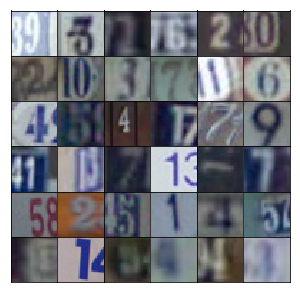

In [8]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [9]:
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [10]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        # Rui: move the 4th dimension batch_idx, to the 1th demension
        self.train_x = np.rollaxis(self.train_x, 3)  
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
            
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(dataset.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

# Reset Graph

In [11]:
tf.reset_default_graph()

## Network Inputs

Here, just creating some placeholders like normal.

In [12]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3. 

>**Exercise:** Build the transposed convolutional network for the generator in the function below. Be sure to use leaky ReLUs on all the layers except for the last tanh layer, as well as batch normalization on all the transposed convolutional layers except the last one.

In [13]:
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    # :param output_dim: The number of channels in the output image
            
    with tf.variable_scope('generator', reuse=reuse):        
        # First fully connected layer
        layer = tf.layers.dense(z, 4*4*512, activation=None, use_bias=False)
        # 4*4*512
        layer = tf.reshape(layer, (-1, 4, 4, 512))  # the 1th dimension should be -1
        layer = tf.layers.batch_normalization(layer, axis=-1, training=training)
        layer = tf.maximum(alpha * layer, layer)
        
        # Output layer, 32x32x3        
        # 8*8*256        
        # Rui: padding in transposed convolution https://discussions.udacity.com/t/padding-in-transposed-convolution/600424
        layer = tf.layers.conv2d_transpose(layer, filters=256, kernel_size=5, strides=2, activation=None, use_bias=False, padding='same')
        layer = tf.layers.batch_normalization(layer, axis=-1, training=training)        
        layer = tf.maximum(alpha * layer, layer)
        
        # 16*16*128
        layer = tf.layers.conv2d_transpose(layer, filters=128, kernel_size=5, strides=2, activation=None, use_bias=False, padding='same')
        layer = tf.layers.batch_normalization(layer, axis=-1, training=training)        
        layer = tf.maximum(alpha * layer, layer)

        # 32*32*3
        logits = tf.layers.conv2d_transpose(layer, filters=output_dim, kernel_size=5, strides=2, activation=None, use_bias=True, padding='same')
        out = tf.tanh(logits)
        
        return out

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've built before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU.

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

>**Exercise:** Build the convolutional network for the discriminator. The input is a 32x32x3 images, the output is a sigmoid plus the logits. Again, use Leaky ReLU activations and batch normalization on all the layers except the first.

In [14]:
def discriminator(x, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3        
        # 16*16*64
        layer = tf.layers.conv2d(x, filters=64, kernel_size=5, strides=2, activation=None, use_bias=True, padding='same')
        layer = tf.maximum(alpha * layer, layer)        

        # 8*8*128
        layer = tf.layers.conv2d(layer, filters=128, kernel_size=5, strides=2, activation=None, use_bias=False, padding='same')
        layer = tf.layers.batch_normalization(layer, axis=-1, training=training)        
        layer = tf.maximum(alpha * layer, layer)

        # 4*4*256
        layer = tf.layers.conv2d(layer, filters=256, kernel_size=5, strides=2, activation=None, use_bias=False, padding='same')
        layer = tf.layers.batch_normalization(layer, axis=-1, training=training)        
        layer = tf.maximum(alpha * layer, layer)
        
        layer = tf.reshape(layer, (-1, 4*4*256))                
#         layer = tf.layers.flatten(layer)                
        logits = tf.layers.dense(layer, 1, activation=None, use_bias=True)
        out = tf.sigmoid(logits)
                
        return out, logits

## Model Loss

Calculating the loss like before, nothing new here.

In [15]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [16]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [17]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=alpha)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)

Here is a function for displaying generated images.

In [18]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an error without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [26]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):
                steps += 1
#                 print('epoch', e, 'steps', steps)
                
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Run optimizers                
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: x})

#                 if steps % print_every == 0:                
                if (steps == 1) or (steps % print_every == 0):
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "steps", steps,
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

#                 if steps % show_every == 0:                    
                if (e == 0 and steps % 100 == 1) or (steps % show_every == 0):
                    # Rui: use the same sample_z each time to see the images generated
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True, training=False),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) (see Parameters 2) to see what worked for them.

>**Exercise:** Find hyperparameters to train this GAN. The values found in the DCGAN paper work well, or you can experiment on your own. In general, you want the discriminator loss to be around 0.3, this means it is correctly classifying images as fake or real about 50% of the time. You want the generator loss to be around 2 or 3.

In [20]:
# Load the data and train the network here
dataset = Dataset(trainset, testset)

### Parameters 1

Epoch 1/1... steps 10 Discriminator Loss: 0.0331... Generator Loss: 4.9680
Epoch 1/1... steps 20 Discriminator Loss: 0.0515... Generator Loss: 3.5349
Epoch 1/1... steps 30 Discriminator Loss: 0.0609... Generator Loss: 5.9758
Epoch 1/1... steps 40 Discriminator Loss: 0.0424... Generator Loss: 5.2729
Epoch 1/1... steps 50 Discriminator Loss: 0.0344... Generator Loss: 6.2648
Epoch 1/1... steps 60 Discriminator Loss: 0.0199... Generator Loss: 5.5887
Epoch 1/1... steps 70 Discriminator Loss: 0.0061... Generator Loss: 6.2558
Epoch 1/1... steps 80 Discriminator Loss: 0.2534... Generator Loss: 12.9550
Epoch 1/1... steps 90 Discriminator Loss: 0.3103... Generator Loss: 10.4458
Epoch 1/1... steps 100 Discriminator Loss: 0.0235... Generator Loss: 5.7096


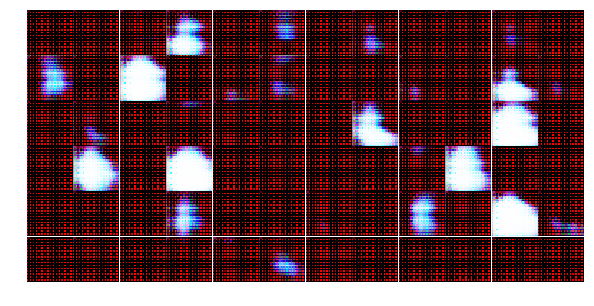

Epoch 1/1... steps 110 Discriminator Loss: 0.0363... Generator Loss: 5.0392
Epoch 1/1... steps 120 Discriminator Loss: 0.0736... Generator Loss: 4.3122
Epoch 1/1... steps 130 Discriminator Loss: 0.0221... Generator Loss: 6.4534
Epoch 1/1... steps 140 Discriminator Loss: 0.0100... Generator Loss: 5.9199
Epoch 1/1... steps 150 Discriminator Loss: 0.0019... Generator Loss: 7.2204
Epoch 1/1... steps 160 Discriminator Loss: 0.0248... Generator Loss: 4.0101
Epoch 1/1... steps 170 Discriminator Loss: 0.0014... Generator Loss: 12.0356
Epoch 1/1... steps 180 Discriminator Loss: 0.0052... Generator Loss: 9.6562
Epoch 1/1... steps 190 Discriminator Loss: 0.0214... Generator Loss: 7.4628
Epoch 1/1... steps 200 Discriminator Loss: 0.0171... Generator Loss: 9.2981


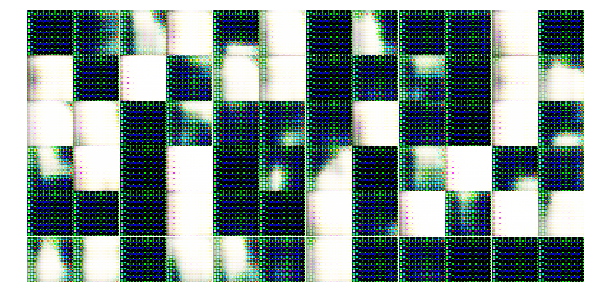

Epoch 1/1... steps 210 Discriminator Loss: 0.0103... Generator Loss: 5.2149
Epoch 1/1... steps 220 Discriminator Loss: 0.0012... Generator Loss: 8.2296
Epoch 1/1... steps 230 Discriminator Loss: 0.0031... Generator Loss: 6.9947
Epoch 1/1... steps 240 Discriminator Loss: 0.0061... Generator Loss: 8.3907
Epoch 1/1... steps 250 Discriminator Loss: 0.0022... Generator Loss: 10.3213
Epoch 1/1... steps 260 Discriminator Loss: 1.2482... Generator Loss: 5.3105
Epoch 1/1... steps 270 Discriminator Loss: 0.2391... Generator Loss: 3.8769
Epoch 1/1... steps 280 Discriminator Loss: 0.1627... Generator Loss: 4.7233
Epoch 1/1... steps 290 Discriminator Loss: 0.0822... Generator Loss: 3.6810
Epoch 1/1... steps 300 Discriminator Loss: 0.1013... Generator Loss: 3.5746


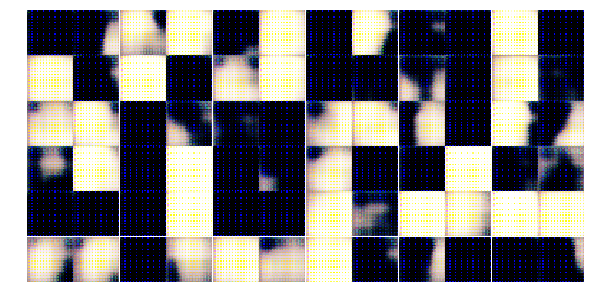

Epoch 1/1... steps 310 Discriminator Loss: 0.1324... Generator Loss: 3.1766
Epoch 1/1... steps 320 Discriminator Loss: 0.0141... Generator Loss: 6.8787
Epoch 1/1... steps 330 Discriminator Loss: 0.0214... Generator Loss: 4.9001
Epoch 1/1... steps 340 Discriminator Loss: 0.1407... Generator Loss: 3.4440
Epoch 1/1... steps 350 Discriminator Loss: 0.0369... Generator Loss: 4.7929
Epoch 1/1... steps 360 Discriminator Loss: 0.1842... Generator Loss: 2.7673
Epoch 1/1... steps 370 Discriminator Loss: 0.1124... Generator Loss: 3.2165
Epoch 1/1... steps 380 Discriminator Loss: 0.1662... Generator Loss: 5.0343
Epoch 1/1... steps 390 Discriminator Loss: 0.0273... Generator Loss: 4.8306
Epoch 1/1... steps 400 Discriminator Loss: 0.0319... Generator Loss: 7.5776


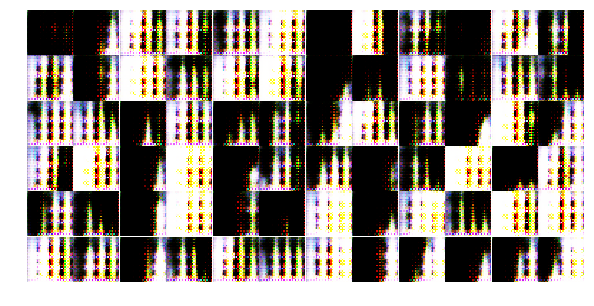

Epoch 1/1... steps 410 Discriminator Loss: 0.0165... Generator Loss: 6.6521
Epoch 1/1... steps 420 Discriminator Loss: 0.0039... Generator Loss: 8.2864
Epoch 1/1... steps 430 Discriminator Loss: 0.2719... Generator Loss: 12.2154
Epoch 1/1... steps 440 Discriminator Loss: 0.0337... Generator Loss: 4.9730
Epoch 1/1... steps 450 Discriminator Loss: 0.0636... Generator Loss: 4.7126
Epoch 1/1... steps 460 Discriminator Loss: 0.0134... Generator Loss: 5.8167
Epoch 1/1... steps 470 Discriminator Loss: 0.0150... Generator Loss: 6.1340
Epoch 1/1... steps 480 Discriminator Loss: 0.0266... Generator Loss: 5.3383
Epoch 1/1... steps 490 Discriminator Loss: 0.0454... Generator Loss: 5.1801
Epoch 1/1... steps 500 Discriminator Loss: 0.0250... Generator Loss: 5.6352


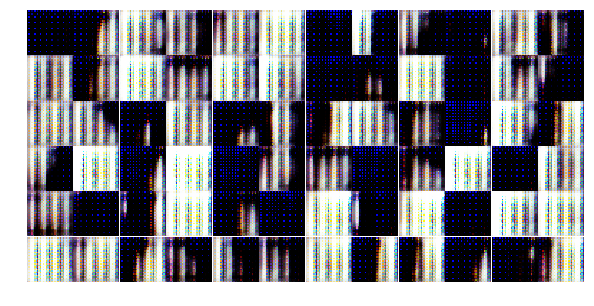

Epoch 1/1... steps 510 Discriminator Loss: 0.0119... Generator Loss: 5.9741
Epoch 1/1... steps 520 Discriminator Loss: 0.1937... Generator Loss: 4.2799
Epoch 1/1... steps 530 Discriminator Loss: 0.2966... Generator Loss: 3.1309
Epoch 1/1... steps 540 Discriminator Loss: 0.1082... Generator Loss: 2.9080
Epoch 1/1... steps 550 Discriminator Loss: 0.0128... Generator Loss: 8.1535
Epoch 1/1... steps 560 Discriminator Loss: 0.0278... Generator Loss: 5.6206
Epoch 1/1... steps 570 Discriminator Loss: 0.0233... Generator Loss: 4.6325
Epoch 1/1... steps 580 Discriminator Loss: 0.0265... Generator Loss: 5.3844
Epoch 1/1... steps 590 Discriminator Loss: 0.2860... Generator Loss: 7.5882
Epoch 1/1... steps 600 Discriminator Loss: 0.0173... Generator Loss: 6.2097


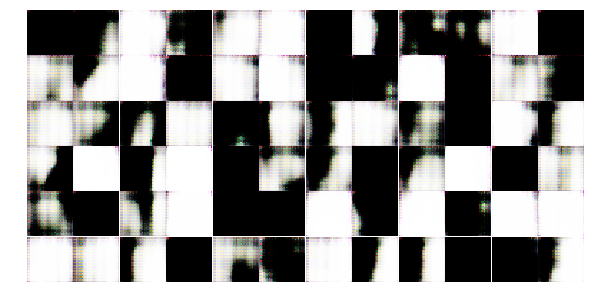

Epoch 1/1... steps 610 Discriminator Loss: 0.1102... Generator Loss: 2.9537
Epoch 1/1... steps 620 Discriminator Loss: 0.2930... Generator Loss: 4.6502
Epoch 1/1... steps 630 Discriminator Loss: 0.1595... Generator Loss: 4.8114
Epoch 1/1... steps 640 Discriminator Loss: 0.3832... Generator Loss: 5.4997
Epoch 1/1... steps 650 Discriminator Loss: 0.2967... Generator Loss: 4.0596
Epoch 1/1... steps 660 Discriminator Loss: 0.0594... Generator Loss: 7.0903
Epoch 1/1... steps 670 Discriminator Loss: 0.2000... Generator Loss: 3.4043
Epoch 1/1... steps 680 Discriminator Loss: 0.0328... Generator Loss: 4.7925
Epoch 1/1... steps 690 Discriminator Loss: 0.0289... Generator Loss: 4.9476
Epoch 1/1... steps 700 Discriminator Loss: 0.1003... Generator Loss: 3.5694


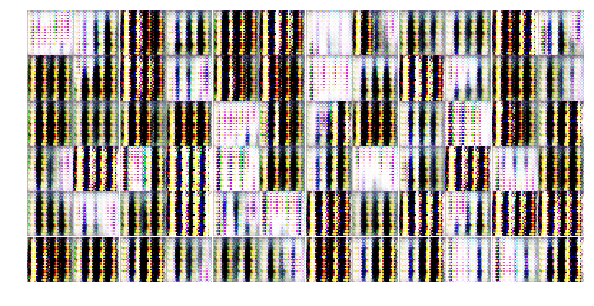

Epoch 1/1... steps 710 Discriminator Loss: 0.0260... Generator Loss: 5.8743
Epoch 1/1... steps 720 Discriminator Loss: 0.0248... Generator Loss: 4.5675
Epoch 1/1... steps 730 Discriminator Loss: 0.0292... Generator Loss: 4.5543
Epoch 1/1... steps 740 Discriminator Loss: 0.4583... Generator Loss: 10.1356
Epoch 1/1... steps 750 Discriminator Loss: 0.7733... Generator Loss: 1.0151
Epoch 1/1... steps 760 Discriminator Loss: 0.0531... Generator Loss: 4.0340
Epoch 1/1... steps 770 Discriminator Loss: 0.1020... Generator Loss: 14.6604
Epoch 1/1... steps 780 Discriminator Loss: 0.0621... Generator Loss: 8.0872
Epoch 1/1... steps 790 Discriminator Loss: 0.0822... Generator Loss: 5.0669
Epoch 1/1... steps 800 Discriminator Loss: 0.0624... Generator Loss: 9.2599


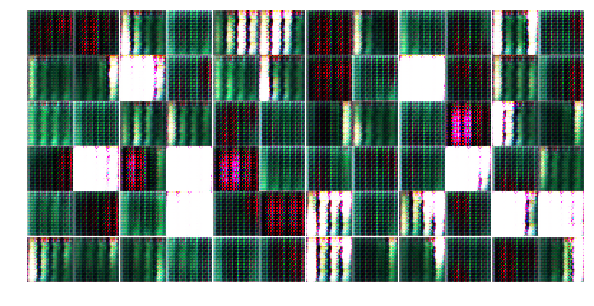

Epoch 1/1... steps 810 Discriminator Loss: 0.0239... Generator Loss: 4.2077
Epoch 1/1... steps 820 Discriminator Loss: 0.0225... Generator Loss: 6.1567
Epoch 1/1... steps 830 Discriminator Loss: 0.0051... Generator Loss: 6.1860
Epoch 1/1... steps 840 Discriminator Loss: 0.0010... Generator Loss: 8.4377
Epoch 1/1... steps 850 Discriminator Loss: 0.0126... Generator Loss: 5.8744
Epoch 1/1... steps 860 Discriminator Loss: 0.1166... Generator Loss: 5.0512
Epoch 1/1... steps 870 Discriminator Loss: 0.0414... Generator Loss: 5.3867
Epoch 1/1... steps 880 Discriminator Loss: 0.0095... Generator Loss: 5.8726
Epoch 1/1... steps 890 Discriminator Loss: 0.2855... Generator Loss: 12.0566
Epoch 1/1... steps 900 Discriminator Loss: 0.0868... Generator Loss: 2.7837


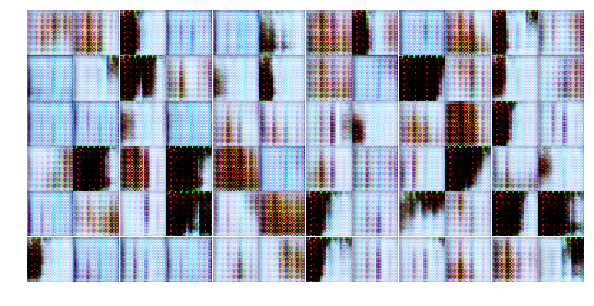

Epoch 1/1... steps 910 Discriminator Loss: 0.0543... Generator Loss: 4.7512
Epoch 1/1... steps 920 Discriminator Loss: 0.1534... Generator Loss: 5.4779
Epoch 1/1... steps 930 Discriminator Loss: 0.1716... Generator Loss: 6.0519
Epoch 1/1... steps 940 Discriminator Loss: 0.0081... Generator Loss: 5.5512
Epoch 1/1... steps 950 Discriminator Loss: 0.0162... Generator Loss: 6.5936
Epoch 1/1... steps 960 Discriminator Loss: 0.0291... Generator Loss: 4.9398
Epoch 1/1... steps 970 Discriminator Loss: 0.0086... Generator Loss: 5.5648
Epoch 1/1... steps 980 Discriminator Loss: 0.0043... Generator Loss: 6.3315
Epoch 1/1... steps 990 Discriminator Loss: 0.0254... Generator Loss: 6.2783
Epoch 1/1... steps 1000 Discriminator Loss: 0.0130... Generator Loss: 4.9224


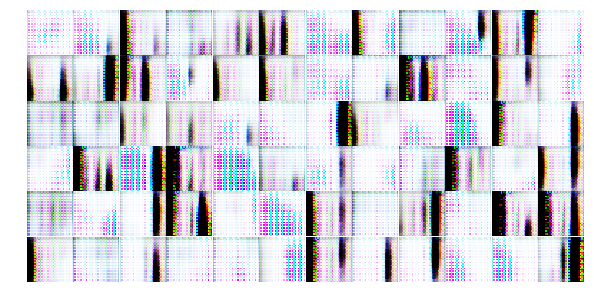

Epoch 1/1... steps 1010 Discriminator Loss: 0.0437... Generator Loss: 7.0227
Epoch 1/1... steps 1020 Discriminator Loss: 0.0163... Generator Loss: 5.8472
Epoch 1/1... steps 1030 Discriminator Loss: 0.0363... Generator Loss: 5.2522
Epoch 1/1... steps 1040 Discriminator Loss: 0.0021... Generator Loss: 10.7012
Epoch 1/1... steps 1050 Discriminator Loss: 0.0267... Generator Loss: 5.1814
Epoch 1/1... steps 1060 Discriminator Loss: 0.2052... Generator Loss: 3.5590
Epoch 1/1... steps 1070 Discriminator Loss: 0.0252... Generator Loss: 6.5484
Epoch 1/1... steps 1080 Discriminator Loss: 0.0917... Generator Loss: 4.5801
Epoch 1/1... steps 1090 Discriminator Loss: 0.0754... Generator Loss: 3.9835
Epoch 1/1... steps 1100 Discriminator Loss: 0.3477... Generator Loss: 13.3779


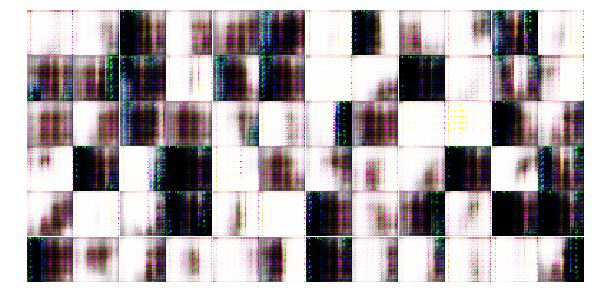

Epoch 1/1... steps 1110 Discriminator Loss: 0.4263... Generator Loss: 13.0437
Epoch 1/1... steps 1120 Discriminator Loss: 0.0420... Generator Loss: 5.8436
Epoch 1/1... steps 1130 Discriminator Loss: 0.3339... Generator Loss: 5.6232
Epoch 1/1... steps 1140 Discriminator Loss: 0.0397... Generator Loss: 4.9814


In [111]:
real_size = (32,32,3)

z_size = 100

learning_rate = 0.001

epochs = 1
batch_size = 64
alpha = 0.01
beta1 = 0.9

# Solution:
# real_size = (32,32,3)

# z_size = 100

# learning_rate = 0.0002

# epochs = 25
# batch_size = 128
# alpha = 0.2
# beta1 = 0.5



# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5))

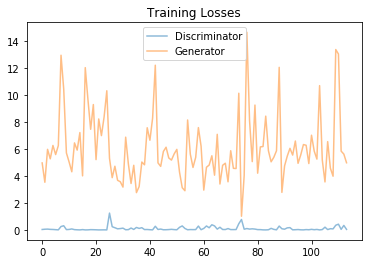

In [112]:
# fig, ax = plt.subplots()
# losses = np.array(losses)
# plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
# plt.plot(losses.T[1], label='Generator', alpha=0.5)
# plt.title("Training Losses")
# plt.legend()

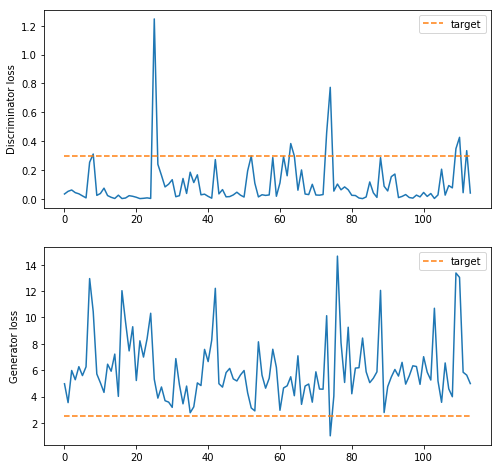

In [130]:
losses = np.array(losses)

fig, axes = plt.subplots(2, 1, figsize=(8,8),)
ylabels = ['Discriminator loss', 'Generator loss']
targets = [0.3, 2.5]
for i, ax in zip([0, 1], axes.flatten()):
    ax.plot(losses.T[i])
    ax.plot([targets[i]] * len(losses.T[i]), label='target', linestyle='--')    
    ax.set_ylabel(ylabels[i])
    ax.legend()

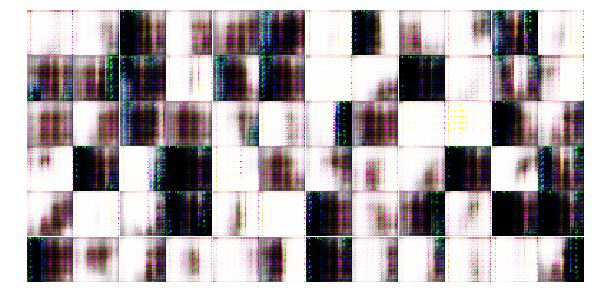

In [113]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))

### Parameters 2: parameters in the DCGAN paper

Epoch 1/25... steps 1 Discriminator Loss: 4.9836... Generator Loss: 0.0145


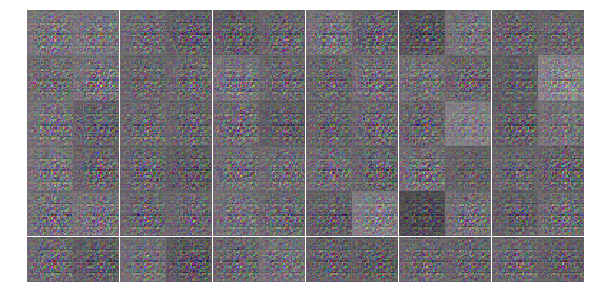

Epoch 1/25... steps 50 Discriminator Loss: 0.1388... Generator Loss: 2.7410
Epoch 1/25... steps 100 Discriminator Loss: 0.1627... Generator Loss: 2.8915


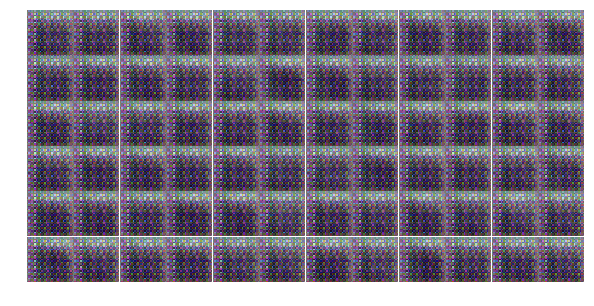

Epoch 1/25... steps 150 Discriminator Loss: 0.6356... Generator Loss: 2.1048
Epoch 1/25... steps 200 Discriminator Loss: 0.3419... Generator Loss: 2.3222


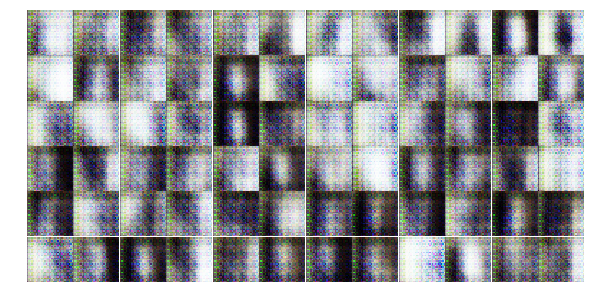

Epoch 1/25... steps 250 Discriminator Loss: 0.3185... Generator Loss: 2.7499
Epoch 1/25... steps 300 Discriminator Loss: 0.7547... Generator Loss: 1.5261


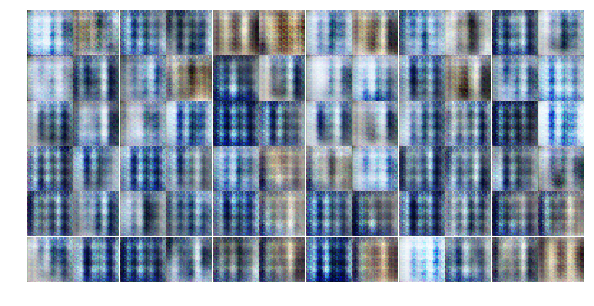

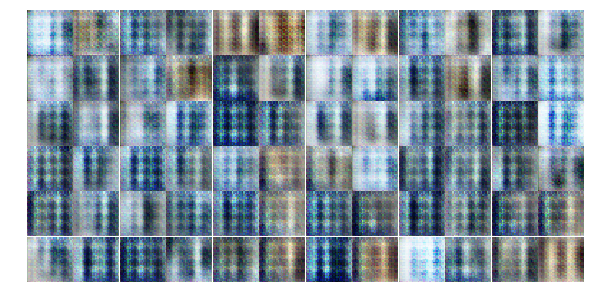

Epoch 1/25... steps 350 Discriminator Loss: 0.6866... Generator Loss: 1.6274
Epoch 1/25... steps 400 Discriminator Loss: 0.5734... Generator Loss: 1.5239


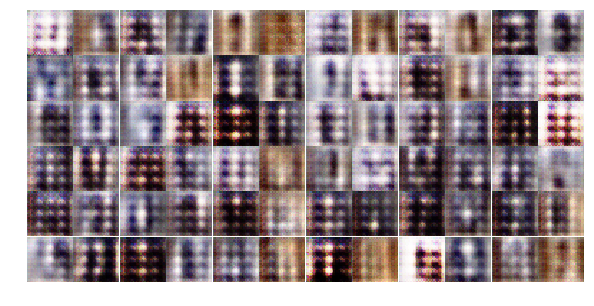

Epoch 1/25... steps 450 Discriminator Loss: 1.0755... Generator Loss: 0.7981
Epoch 1/25... steps 500 Discriminator Loss: 0.6002... Generator Loss: 1.3943


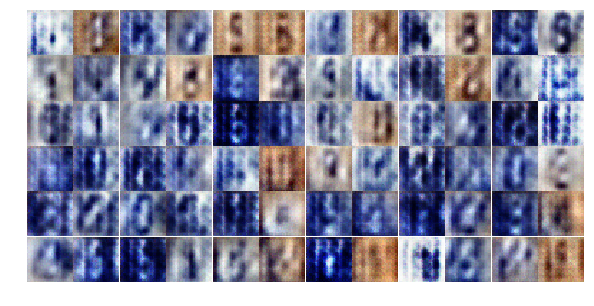

Epoch 1/25... steps 550 Discriminator Loss: 0.5037... Generator Loss: 2.0169
Epoch 2/25... steps 600 Discriminator Loss: 1.1912... Generator Loss: 0.7069


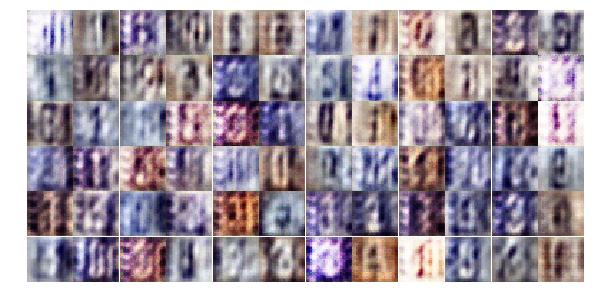

Epoch 2/25... steps 650 Discriminator Loss: 1.1667... Generator Loss: 0.7593
Epoch 2/25... steps 700 Discriminator Loss: 1.0755... Generator Loss: 0.9585
Epoch 2/25... steps 750 Discriminator Loss: 1.0549... Generator Loss: 1.0265
Epoch 2/25... steps 800 Discriminator Loss: 1.1202... Generator Loss: 0.7825
Epoch 2/25... steps 850 Discriminator Loss: 1.1003... Generator Loss: 0.9382
Epoch 2/25... steps 900 Discriminator Loss: 0.7445... Generator Loss: 1.3347


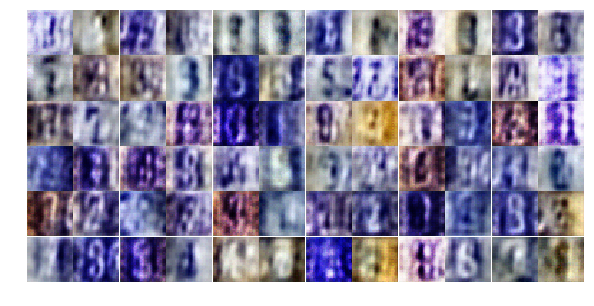

Epoch 2/25... steps 950 Discriminator Loss: 0.9722... Generator Loss: 1.2129
Epoch 2/25... steps 1000 Discriminator Loss: 0.9805... Generator Loss: 0.9547
Epoch 2/25... steps 1050 Discriminator Loss: 1.0099... Generator Loss: 0.8602
Epoch 2/25... steps 1100 Discriminator Loss: 1.0639... Generator Loss: 0.7964
Epoch 3/25... steps 1150 Discriminator Loss: 0.7947... Generator Loss: 2.1148
Epoch 3/25... steps 1200 Discriminator Loss: 0.5129... Generator Loss: 2.4027


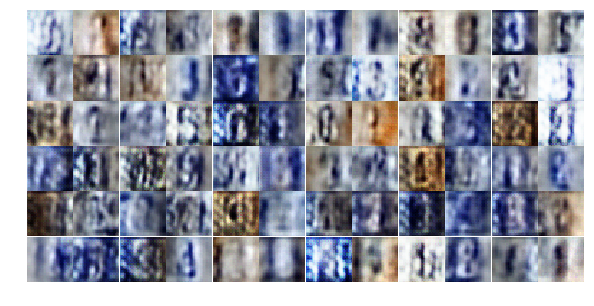

Epoch 3/25... steps 1250 Discriminator Loss: 1.0055... Generator Loss: 1.7611
Epoch 3/25... steps 1300 Discriminator Loss: 0.8767... Generator Loss: 0.9664
Epoch 3/25... steps 1350 Discriminator Loss: 0.6844... Generator Loss: 1.1494
Epoch 3/25... steps 1400 Discriminator Loss: 0.8987... Generator Loss: 0.9546
Epoch 3/25... steps 1450 Discriminator Loss: 0.5832... Generator Loss: 1.6555
Epoch 3/25... steps 1500 Discriminator Loss: 0.7854... Generator Loss: 1.6666


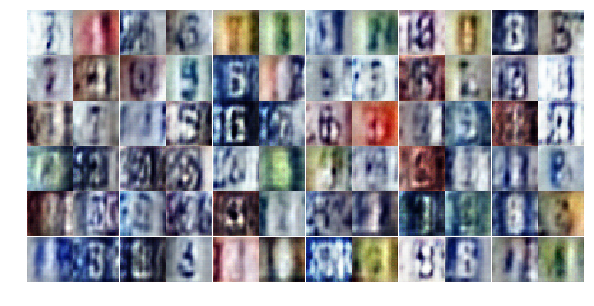

Epoch 3/25... steps 1550 Discriminator Loss: 1.4245... Generator Loss: 5.5700
Epoch 3/25... steps 1600 Discriminator Loss: 0.8210... Generator Loss: 1.1334
Epoch 3/25... steps 1650 Discriminator Loss: 0.5004... Generator Loss: 1.4445
Epoch 3/25... steps 1700 Discriminator Loss: 0.5450... Generator Loss: 1.8319
Epoch 4/25... steps 1750 Discriminator Loss: 0.3659... Generator Loss: 2.1663
Epoch 4/25... steps 1800 Discriminator Loss: 0.4307... Generator Loss: 1.6466


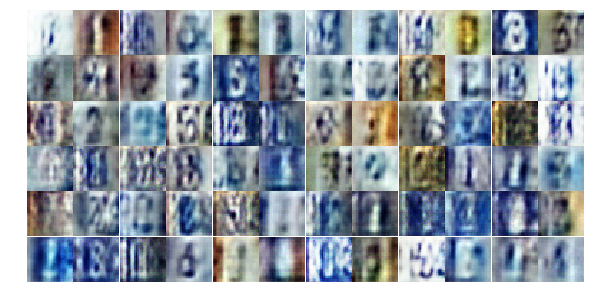

Epoch 4/25... steps 1850 Discriminator Loss: 0.6199... Generator Loss: 2.7338
Epoch 4/25... steps 1900 Discriminator Loss: 0.5559... Generator Loss: 1.3931
Epoch 4/25... steps 1950 Discriminator Loss: 0.3097... Generator Loss: 2.8072
Epoch 4/25... steps 2000 Discriminator Loss: 0.4768... Generator Loss: 1.4587
Epoch 4/25... steps 2050 Discriminator Loss: 0.5563... Generator Loss: 1.1808
Epoch 4/25... steps 2100 Discriminator Loss: 0.5918... Generator Loss: 1.2470


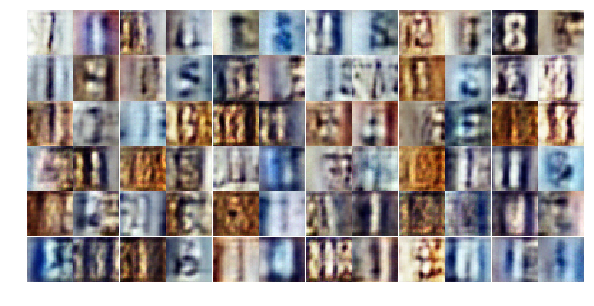

Epoch 4/25... steps 2150 Discriminator Loss: 0.5239... Generator Loss: 1.4778
Epoch 4/25... steps 2200 Discriminator Loss: 0.4933... Generator Loss: 2.5114
Epoch 4/25... steps 2250 Discriminator Loss: 0.9015... Generator Loss: 0.9242
Epoch 5/25... steps 2300 Discriminator Loss: 0.3905... Generator Loss: 1.8137
Epoch 5/25... steps 2350 Discriminator Loss: 0.5956... Generator Loss: 2.8758
Epoch 5/25... steps 2400 Discriminator Loss: 0.6381... Generator Loss: 1.3182


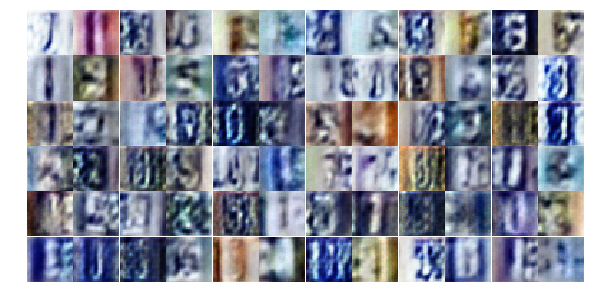

Epoch 5/25... steps 2450 Discriminator Loss: 0.6422... Generator Loss: 1.3108
Epoch 5/25... steps 2500 Discriminator Loss: 0.3177... Generator Loss: 2.2493
Epoch 5/25... steps 2550 Discriminator Loss: 0.7395... Generator Loss: 0.8819
Epoch 5/25... steps 2600 Discriminator Loss: 0.4142... Generator Loss: 1.9104
Epoch 5/25... steps 2650 Discriminator Loss: 0.5062... Generator Loss: 2.2175
Epoch 5/25... steps 2700 Discriminator Loss: 0.5590... Generator Loss: 1.1536


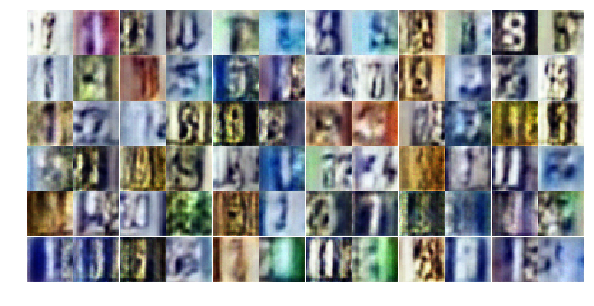

Epoch 5/25... steps 2750 Discriminator Loss: 0.6476... Generator Loss: 1.3914
Epoch 5/25... steps 2800 Discriminator Loss: 0.3602... Generator Loss: 1.7816
Epoch 5/25... steps 2850 Discriminator Loss: 0.6494... Generator Loss: 1.3033
Epoch 6/25... steps 2900 Discriminator Loss: 0.8835... Generator Loss: 0.7440
Epoch 6/25... steps 2950 Discriminator Loss: 0.9037... Generator Loss: 0.6819
Epoch 6/25... steps 3000 Discriminator Loss: 0.5724... Generator Loss: 1.4062


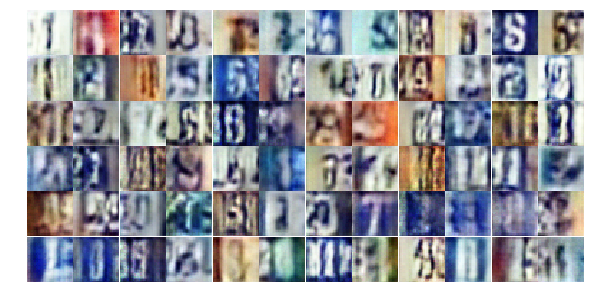

Epoch 6/25... steps 3050 Discriminator Loss: 0.3896... Generator Loss: 1.7719
Epoch 6/25... steps 3100 Discriminator Loss: 0.8958... Generator Loss: 0.7466
Epoch 6/25... steps 3150 Discriminator Loss: 0.5359... Generator Loss: 1.2223
Epoch 6/25... steps 3200 Discriminator Loss: 0.3929... Generator Loss: 1.9956
Epoch 6/25... steps 3250 Discriminator Loss: 0.9842... Generator Loss: 0.6147
Epoch 6/25... steps 3300 Discriminator Loss: 0.4225... Generator Loss: 1.5585


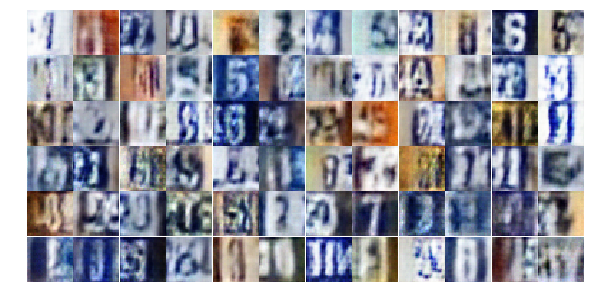

Epoch 6/25... steps 3350 Discriminator Loss: 0.7599... Generator Loss: 0.8798
Epoch 6/25... steps 3400 Discriminator Loss: 1.2143... Generator Loss: 0.4617
Epoch 7/25... steps 3450 Discriminator Loss: 0.8482... Generator Loss: 0.7459
Epoch 7/25... steps 3500 Discriminator Loss: 0.9966... Generator Loss: 0.6936
Epoch 7/25... steps 3550 Discriminator Loss: 0.4405... Generator Loss: 1.4629
Epoch 7/25... steps 3600 Discriminator Loss: 0.6044... Generator Loss: 1.2200


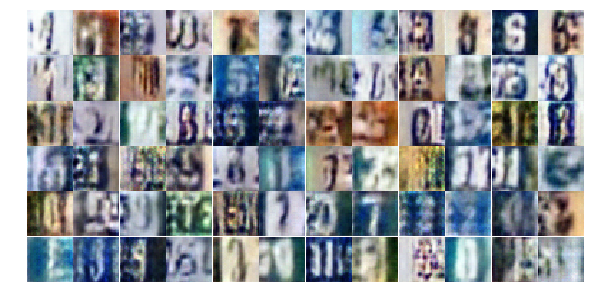

Epoch 7/25... steps 3650 Discriminator Loss: 0.4051... Generator Loss: 1.7159
Epoch 7/25... steps 3700 Discriminator Loss: 0.6288... Generator Loss: 2.0409
Epoch 7/25... steps 3750 Discriminator Loss: 0.6570... Generator Loss: 1.1094
Epoch 7/25... steps 3800 Discriminator Loss: 0.5267... Generator Loss: 2.7941
Epoch 7/25... steps 3850 Discriminator Loss: 1.4423... Generator Loss: 3.1389
Epoch 7/25... steps 3900 Discriminator Loss: 1.0883... Generator Loss: 0.6031


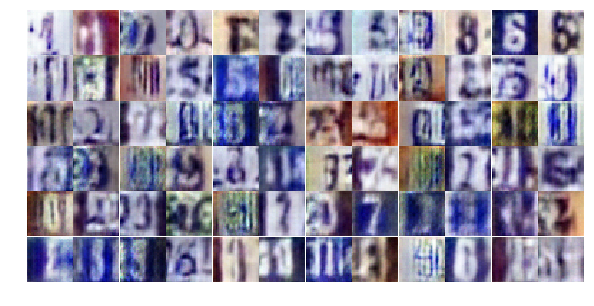

Epoch 7/25... steps 3950 Discriminator Loss: 0.5202... Generator Loss: 1.1941
Epoch 7/25... steps 4000 Discriminator Loss: 0.5356... Generator Loss: 1.1080
Epoch 8/25... steps 4050 Discriminator Loss: 0.7552... Generator Loss: 0.9287
Epoch 8/25... steps 4100 Discriminator Loss: 0.6467... Generator Loss: 0.9883
Epoch 8/25... steps 4150 Discriminator Loss: 1.9170... Generator Loss: 0.2196
Epoch 8/25... steps 4200 Discriminator Loss: 1.8779... Generator Loss: 0.2447


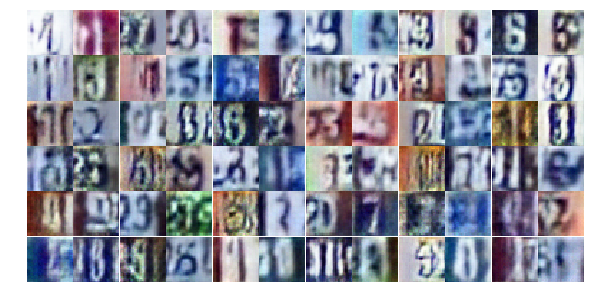

Epoch 8/25... steps 4250 Discriminator Loss: 0.4916... Generator Loss: 1.3541
Epoch 8/25... steps 4300 Discriminator Loss: 0.5952... Generator Loss: 1.7139
Epoch 8/25... steps 4350 Discriminator Loss: 0.8456... Generator Loss: 0.7830
Epoch 8/25... steps 4400 Discriminator Loss: 0.4971... Generator Loss: 1.3864
Epoch 8/25... steps 4450 Discriminator Loss: 0.7380... Generator Loss: 1.2739
Epoch 8/25... steps 4500 Discriminator Loss: 0.6291... Generator Loss: 1.1470


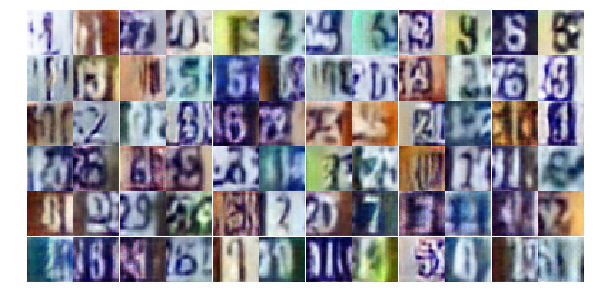

Epoch 8/25... steps 4550 Discriminator Loss: 0.5092... Generator Loss: 2.3387
Epoch 9/25... steps 4600 Discriminator Loss: 0.9155... Generator Loss: 0.6945
Epoch 9/25... steps 4650 Discriminator Loss: 1.3354... Generator Loss: 0.4774
Epoch 9/25... steps 4700 Discriminator Loss: 0.5967... Generator Loss: 1.1588
Epoch 9/25... steps 4750 Discriminator Loss: 0.9665... Generator Loss: 0.7025
Epoch 9/25... steps 4800 Discriminator Loss: 0.4792... Generator Loss: 1.3552


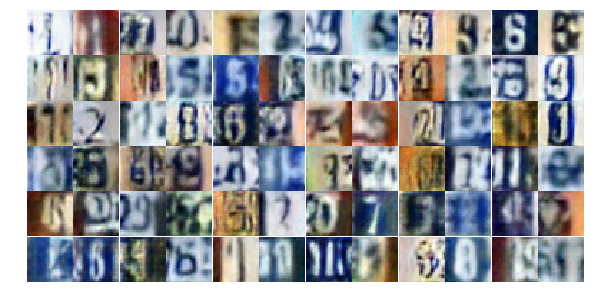

Epoch 9/25... steps 4850 Discriminator Loss: 1.1701... Generator Loss: 2.8109
Epoch 9/25... steps 4900 Discriminator Loss: 0.5612... Generator Loss: 1.1626
Epoch 9/25... steps 4950 Discriminator Loss: 0.5080... Generator Loss: 1.4247
Epoch 9/25... steps 5000 Discriminator Loss: 0.5613... Generator Loss: 1.0838
Epoch 9/25... steps 5050 Discriminator Loss: 0.7321... Generator Loss: 0.9798
Epoch 9/25... steps 5100 Discriminator Loss: 0.6299... Generator Loss: 2.0111


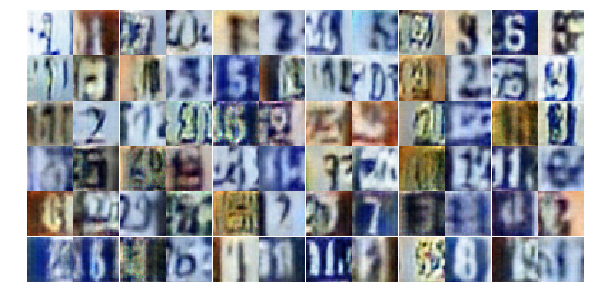

Epoch 9/25... steps 5150 Discriminator Loss: 0.6840... Generator Loss: 1.1136
Epoch 10/25... steps 5200 Discriminator Loss: 1.1336... Generator Loss: 0.5359
Epoch 10/25... steps 5250 Discriminator Loss: 0.4413... Generator Loss: 1.5693
Epoch 10/25... steps 5300 Discriminator Loss: 0.3963... Generator Loss: 1.7997
Epoch 10/25... steps 5350 Discriminator Loss: 0.5990... Generator Loss: 1.0604
Epoch 10/25... steps 5400 Discriminator Loss: 0.4158... Generator Loss: 3.5827


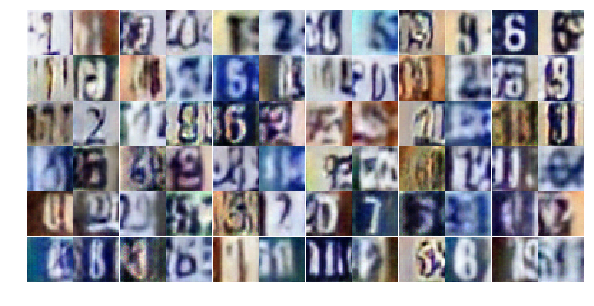

Epoch 10/25... steps 5450 Discriminator Loss: 1.5630... Generator Loss: 0.3055
Epoch 10/25... steps 5500 Discriminator Loss: 1.2970... Generator Loss: 0.7197
Epoch 10/25... steps 5550 Discriminator Loss: 0.3307... Generator Loss: 2.3582
Epoch 10/25... steps 5600 Discriminator Loss: 2.9910... Generator Loss: 0.0849
Epoch 10/25... steps 5650 Discriminator Loss: 1.0780... Generator Loss: 0.9926
Epoch 10/25... steps 5700 Discriminator Loss: 0.6928... Generator Loss: 1.3624


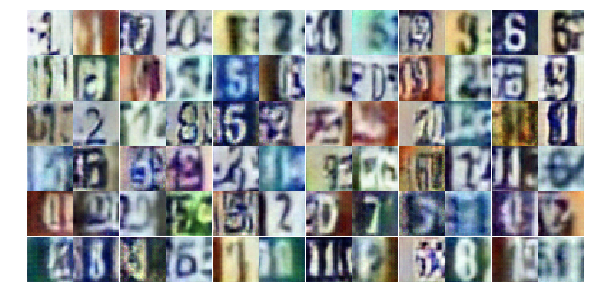

Epoch 11/25... steps 5750 Discriminator Loss: 0.6681... Generator Loss: 1.1349
Epoch 11/25... steps 5800 Discriminator Loss: 0.2410... Generator Loss: 2.2665
Epoch 11/25... steps 5850 Discriminator Loss: 0.7927... Generator Loss: 1.5390
Epoch 11/25... steps 5900 Discriminator Loss: 1.6418... Generator Loss: 0.2796
Epoch 11/25... steps 5950 Discriminator Loss: 0.3244... Generator Loss: 1.7132
Epoch 11/25... steps 6000 Discriminator Loss: 0.4738... Generator Loss: 1.2674


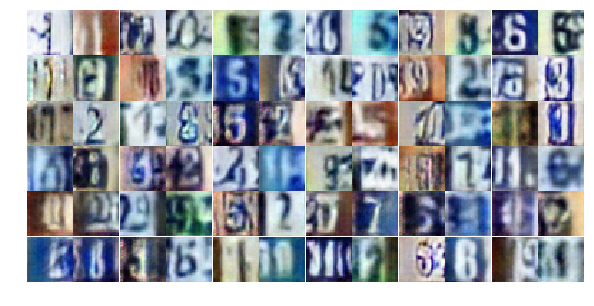

Epoch 11/25... steps 6050 Discriminator Loss: 1.0673... Generator Loss: 0.6645
Epoch 11/25... steps 6100 Discriminator Loss: 0.4682... Generator Loss: 2.7993
Epoch 11/25... steps 6150 Discriminator Loss: 0.5258... Generator Loss: 1.2390
Epoch 11/25... steps 6200 Discriminator Loss: 0.4164... Generator Loss: 1.7409
Epoch 11/25... steps 6250 Discriminator Loss: 0.2627... Generator Loss: 1.9885
Epoch 11/25... steps 6300 Discriminator Loss: 0.2336... Generator Loss: 2.3031


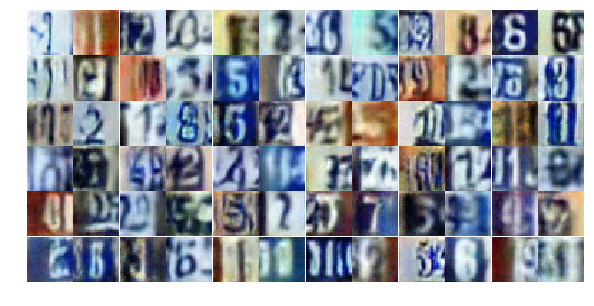

Epoch 12/25... steps 6350 Discriminator Loss: 0.6819... Generator Loss: 1.0057
Epoch 12/25... steps 6400 Discriminator Loss: 1.0815... Generator Loss: 0.5651
Epoch 12/25... steps 6450 Discriminator Loss: 0.4533... Generator Loss: 1.6441
Epoch 12/25... steps 6500 Discriminator Loss: 0.7768... Generator Loss: 1.1624
Epoch 12/25... steps 6550 Discriminator Loss: 0.3586... Generator Loss: 1.7586
Epoch 12/25... steps 6600 Discriminator Loss: 0.3862... Generator Loss: 1.8172


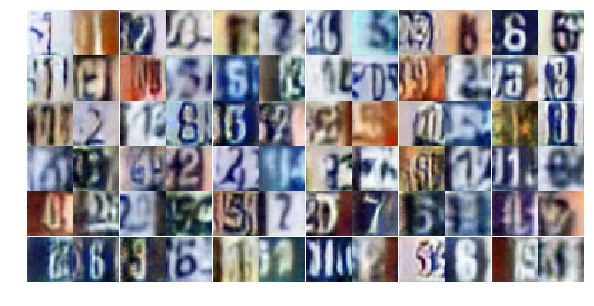

Epoch 12/25... steps 6650 Discriminator Loss: 0.3853... Generator Loss: 3.2398
Epoch 12/25... steps 6700 Discriminator Loss: 0.2668... Generator Loss: 2.4659
Epoch 12/25... steps 6750 Discriminator Loss: 0.5248... Generator Loss: 1.4394
Epoch 12/25... steps 6800 Discriminator Loss: 0.3577... Generator Loss: 2.6045
Epoch 12/25... steps 6850 Discriminator Loss: 0.4869... Generator Loss: 1.3371
Epoch 13/25... steps 6900 Discriminator Loss: 0.9805... Generator Loss: 0.5965


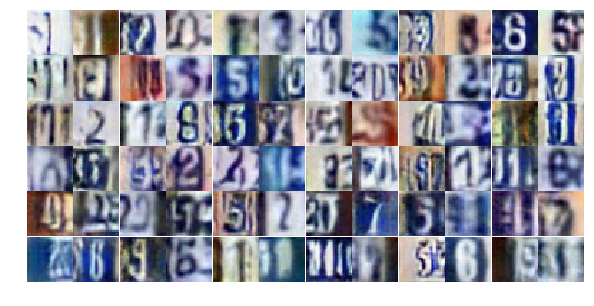

Epoch 13/25... steps 6950 Discriminator Loss: 0.5093... Generator Loss: 1.2971
Epoch 13/25... steps 7000 Discriminator Loss: 0.3816... Generator Loss: 2.1265
Epoch 13/25... steps 7050 Discriminator Loss: 0.3728... Generator Loss: 2.0715
Epoch 13/25... steps 7100 Discriminator Loss: 1.2981... Generator Loss: 0.4249
Epoch 13/25... steps 7150 Discriminator Loss: 1.4160... Generator Loss: 0.3831
Epoch 13/25... steps 7200 Discriminator Loss: 0.3957... Generator Loss: 1.7145


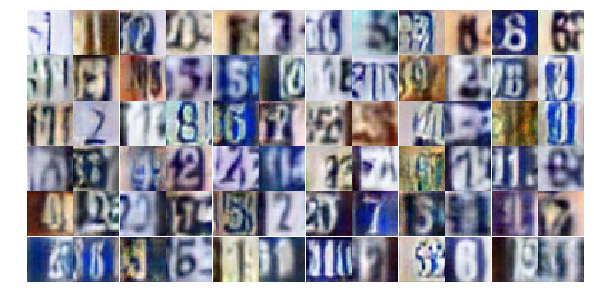

Epoch 13/25... steps 7250 Discriminator Loss: 0.4771... Generator Loss: 1.5605
Epoch 13/25... steps 7300 Discriminator Loss: 0.5598... Generator Loss: 1.0910
Epoch 13/25... steps 7350 Discriminator Loss: 1.0419... Generator Loss: 0.5927
Epoch 13/25... steps 7400 Discriminator Loss: 0.8632... Generator Loss: 0.6739
Epoch 14/25... steps 7450 Discriminator Loss: 0.4222... Generator Loss: 1.5267
Epoch 14/25... steps 7500 Discriminator Loss: 1.0447... Generator Loss: 0.6035


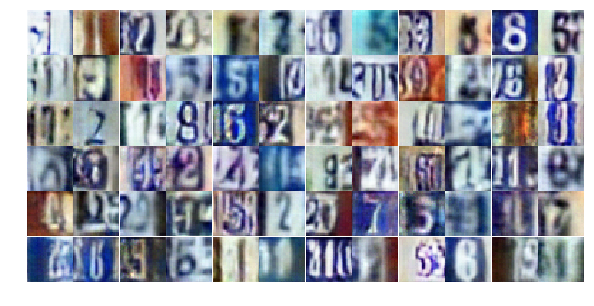

Epoch 14/25... steps 7550 Discriminator Loss: 1.0425... Generator Loss: 0.5885
Epoch 14/25... steps 7600 Discriminator Loss: 1.4495... Generator Loss: 0.4082
Epoch 14/25... steps 7650 Discriminator Loss: 1.1606... Generator Loss: 0.5078
Epoch 14/25... steps 7700 Discriminator Loss: 0.5786... Generator Loss: 1.2118
Epoch 14/25... steps 7750 Discriminator Loss: 1.0285... Generator Loss: 1.2857
Epoch 14/25... steps 7800 Discriminator Loss: 0.8932... Generator Loss: 0.7795


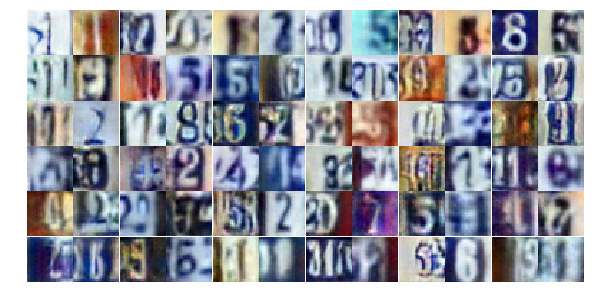

Epoch 14/25... steps 7850 Discriminator Loss: 0.4141... Generator Loss: 1.4598
Epoch 14/25... steps 7900 Discriminator Loss: 1.7099... Generator Loss: 0.3576
Epoch 14/25... steps 7950 Discriminator Loss: 0.5750... Generator Loss: 1.2707
Epoch 14/25... steps 8000 Discriminator Loss: 0.7394... Generator Loss: 0.8857
Epoch 15/25... steps 8050 Discriminator Loss: 0.5394... Generator Loss: 1.2913
Epoch 15/25... steps 8100 Discriminator Loss: 0.5112... Generator Loss: 1.2124


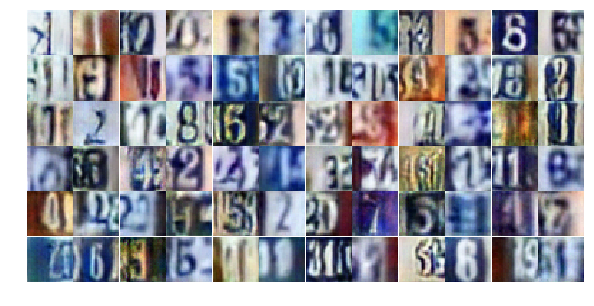

Epoch 15/25... steps 8150 Discriminator Loss: 0.6341... Generator Loss: 1.1855
Epoch 15/25... steps 8200 Discriminator Loss: 0.9287... Generator Loss: 0.7504
Epoch 15/25... steps 8250 Discriminator Loss: 0.9547... Generator Loss: 0.7388
Epoch 15/25... steps 8300 Discriminator Loss: 1.0514... Generator Loss: 0.6524
Epoch 15/25... steps 8350 Discriminator Loss: 0.6509... Generator Loss: 1.0481
Epoch 15/25... steps 8400 Discriminator Loss: 0.4833... Generator Loss: 1.4970


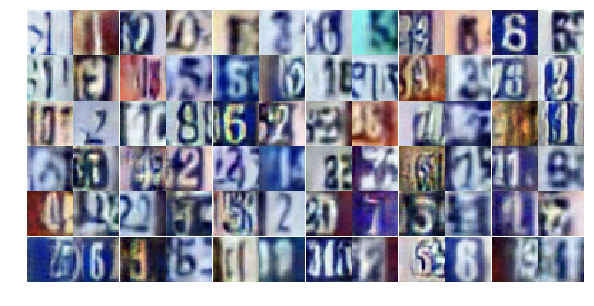

Epoch 15/25... steps 8450 Discriminator Loss: 0.4854... Generator Loss: 1.3122
Epoch 15/25... steps 8500 Discriminator Loss: 0.8338... Generator Loss: 1.0539
Epoch 15/25... steps 8550 Discriminator Loss: 0.5227... Generator Loss: 1.3310
Epoch 16/25... steps 8600 Discriminator Loss: 1.1552... Generator Loss: 0.5200
Epoch 16/25... steps 8650 Discriminator Loss: 0.5135... Generator Loss: 2.2143
Epoch 16/25... steps 8700 Discriminator Loss: 0.6129... Generator Loss: 1.0527


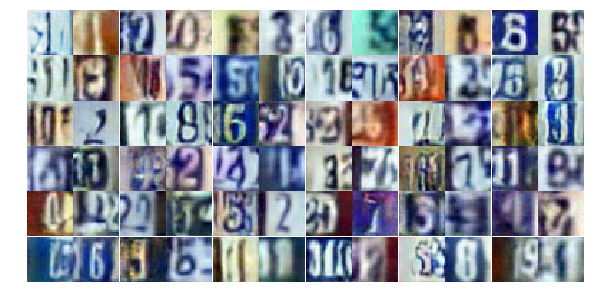

Epoch 16/25... steps 8750 Discriminator Loss: 0.4126... Generator Loss: 1.5805
Epoch 16/25... steps 8800 Discriminator Loss: 0.5366... Generator Loss: 1.1981
Epoch 16/25... steps 8850 Discriminator Loss: 0.6626... Generator Loss: 1.0612
Epoch 16/25... steps 8900 Discriminator Loss: 0.6289... Generator Loss: 1.1501
Epoch 16/25... steps 8950 Discriminator Loss: 0.8585... Generator Loss: 0.8832
Epoch 16/25... steps 9000 Discriminator Loss: 0.4572... Generator Loss: 1.5013


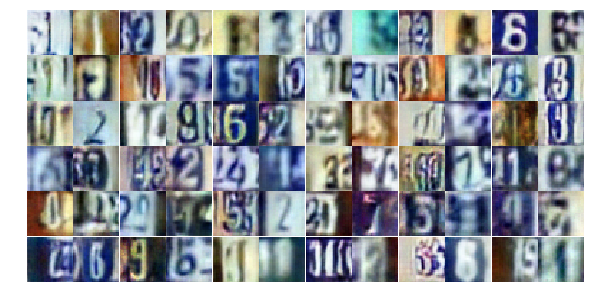

Epoch 16/25... steps 9050 Discriminator Loss: 0.7126... Generator Loss: 1.9454
Epoch 16/25... steps 9100 Discriminator Loss: 0.5790... Generator Loss: 1.1230


In [ ]:
# Solution:
real_size = (32,32,3)

z_size = 100

learning_rate = 0.0002

epochs = 25
batch_size = 128
alpha = 0.2
beta1 = 0.5



# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

losses, samples = train(net, dataset, epochs, batch_size, print_every=50, show_every=300, figsize=(10,5))


In [ ]:
losses = np.array(losses)

fig, axes = plt.subplots(2, 1, figsize=(8,8),)
ylabels = ['Discriminator loss', 'Generator loss']
targets = [0.3, 2.5]
for i, ax in zip([0, 1], axes.flatten()):
    ax.plot(losses.T[i])
    ax.plot([targets[i]] * len(losses.T[i]), label='target', linestyle='--')    
    ax.set_ylabel(ylabels[i])
    ax.legend()

In [ ]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))